# 2018/2/28にPydata Osakaで発表しました #

非常に今更ですが2018/2/28に"SciPyの概要と各モジュールの紹介"というタイトルで発表しました。当日の資料は下記途中のセルにもあるようにAzure Notebooksでも公開していましたが、nikolaではipynbファイルを記事としても公開可能であるため今更にはなりますが公開いたしました。
以下当日の資料になります。

# SciPyの概要と各モジュールの紹介 #

### 自己紹介 ###

* 大橋宏正
    * 某メーカで音響エンジニア
    * scipy.signalとscipy.fftpackを仕事でよく使う
* twitter: @wrist

## 本日の資料 ##

https://notebooks.azure.com/wrist/libraries/pydata-osaka-20180228

## SciPyとは ##

* NumPyの上に作られた数学的なアルゴリズムや便利な関数の集合
* 機能ごとに分けられたサブモジュール群から成る

## 本発表で紹介するサブモジュール(1) ##

* io
    * 様々なファイル入出力
* special
    * 特殊関数
* fftpack
    * FFTルーチン
* interpolate
    * 補間と平滑化
* linalg
    * 線形代数

## サブモジュール一覧(2) ##

* optimize
    * 最適化および求根ルーチン
* signal
    * 信号処理
* spatial
    * 空間データ構造およびアルゴリズム
* stats
    * 確率分布および密度関数
* misc
    * 雑多な諸々

### 本日説明しないモジュール ###

* cluster
    * クラスタリングアルゴリズム
* constants
    * 科学定数、数学定数
* odr
    * 直交距離回帰を行うためのFortranライブラリODRPACKのラッパー
* ndimage
    * N次元画像処理
* sparse
    * 疎行列および関連ルーチン
* integrate
    * 積分および常微分方程式のソルバ

### SciPy 1.0 ###

* 2017/10/25にリリース
* Release Note
    * https://scipy.github.io/devdocs/release.1.0.0.html

## History ##

* 2001: 最初のリリース
* 2005: NumPyへの移行
    * https://www.scipy.org/scipylib/faq.html#what-s-the-story-with-numeric-numarray-and-numpy
    * http://www.numpy.org/old_array_packages.html
* 2007: scikitsの誕生
* 2008: scipy.spatialモジュールと最初のCythonコードが追加
* 2010: 6ヶ月単位のリリースサイクルを採用

* 2011: GitHubに移行
* 2011: Python3サポート
* 2012: sparse graphモジュールと統合的な最適化インタフェースの追加
* 2012: scipy.maxentropyの削除
* 2013: TravisCIでの継続的インテグレーションを開始
* 2015: BLAS/LAPACKに対するCythonインタフェースとベンチマークスイートの追加

* 2017: scipy.LowLevelCallableを用いた統一的なC APIの追加; およびscipy.weaveの削除
* 2017: SciPy 1.0のリリース
    * version 0.1から実に16年

## 何故Version 1.0か？(意訳) ##

* 大枠の背景
    * Scipyはプロダクション環境で使われるほどに成熟し安定したことを反映
    * 技術的な目標(WindowsでのWheel配布、CI)と組織的な目標(組織構造、行動規範、ロードマップ)の両方を近年達成

* 1.0の意味
    * オープンソースプロジェクトにとって"1.0"と言うと100%完成したという印象があるが、実際は完璧ではなくいくつもの修正が必要な点があることを自分たちとしても認めている
    * そうだとしてもSciPyは究極的にユーザーにとって便利なものであり、平均して高いクオリティのコードとドキュメントがあり、1.0のラベルが示すであろう安定性と後方互換性の保証がある。

## SciPyを学ぶ際のリソース ##

* [tutorial](https://docs.scipy.org/doc/scipy/reference/tutorial/)
* [scipy lecture note](http://www.scipy-lectures.org/)

## scipy lecture note: 1.5 Scipy: high-level scientific computing ##

* http://www.scipy-lectures.org/intro/scipy.html
* scipyはさまざまな科学技術計算で共通する問題に対するtoolbox
    * 補間、積分、最適化、画像処理、統計、特殊関数、など
* GSLやmatlabと比較されうるもの

## 本発表 ##

* tutorialとscipy lecture noteからコード等を抜粋して紹介
* scipyを使った計算の簡単なデモ

In [1]:
# azure notebooksデフォルトのSciPyをpipで更新
!pip install -U scipy

Requirement already up-to-date: scipy in /Users/wrist/.pyenv/versions/miniconda3-4.3.30/envs/py36/lib/python3.6/site-packages (1.1.0)


In [2]:
# 本発表では以下を仮定
import numpy as np
import scipy as sp
import matplotlib as mpl
import matplotlib.pyplot as plt

In [3]:
# version
print("numpy version", np.version.full_version)
print("scipy version", sp.version.full_version)
print("matplotlib version", mpl.__version__)

numpy version 1.14.2
scipy version 1.1.0
matplotlib version 2.2.2


## 注意 ##

本発表では基本的にnp.dotの代わりに@演算子を使用

In [4]:
# 本発表では以下を仮定
import scipy.io as spio
import scipy.special as special
import scipy.linalg as la
import scipy.fftpack as fft
import scipy.optimize as opt
import scipy.signal as sg
import scipy.interpolate as interp
import scipy.stats as stats

## scipy.io ##

* io
    * さまざまな形式のファイルIOを提供するモジュール
        * matlabやoctaveのmatファイル
        * netcdf, fortranのunformatted seaquential file, matrix market, harwell-boeing, IDL, Arff形式
    * 何故かwavファイルのIOもできるが24bit音源が読めないのでハイレゾ音源が扱えない

In [5]:
a = np.ones((3, 3))
spio.savemat('file.mat', {'a': a}) # savematには辞書を渡す
data = spio.loadmat('file.mat')
data['a']

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [6]:
a = np.ones(3)
spio.savemat('file.mat', {'a': a})

print(a)
print(spio.loadmat('file.mat')['a']) # matlabには1次元配列がない
print(spio.loadmat('file.mat', squeeze_me=True)["a"])

[1. 1. 1.]
[[1. 1. 1.]]
[1. 1. 1.]


* matlabに関してはstructやcell配列も読めるが割愛
    * 参考: https://docs.scipy.org/doc/scipy/reference/tutorial/io.html

## scipy.special ##

* さまざまな特殊関数が含まれている
    * docstringに色々書かれている
* よく使われると思われるもの
    * ベッセル関数 `scipy.special.jn()`
    * 楕円関数 `scipy.special.ellpj()`
    * ガンマ関数 `scipy.special.gamma()`、対数ガンマ関数 `scipy.special.gammaln()`
    * 誤差関数 `scipy.special.erf()`

In [7]:
special?

### scipy.special.cython_special ###

* cythonバインディングも存在
    * `cimport scipy.special.cython_special`でcythonコード上でcimport
* 型が付いている

In [11]:
%load_ext cython

The cython extension is already loaded. To reload it, use:
  %reload_ext cython


In [12]:
%%cython -a

cimport scipy.special.cython_special as csc

cdef:
    double x = 1
    double complex z = 1 + 1j
    double si, ci, rgam
    double complex cgam

rgam = csc.gamma(x)
print(rgam)
cgam = csc.gamma(z)
print(cgam)
csc.sici(x, &si, &ci)
print(si, ci)

* scipy.special.sici
    * $\int_0^x \frac{\sin t}{t} dt$と$\gamma + \log (x) + \int_0^x \frac{\cos t - 1}{t} dt$を計算

### Tutorial記載の他の内容

* cythonのprangeを使うことでGILを外して並列に回す例
* specialに含まれないがnumpy, scipyで容易に実装可能な関数の紹介
    * 2値エントロピー関数、ヘビサイド関数、ステップ関数、ランプ関数

## scipy.linalg ##

* 線形代数関連の操作を扱うモジュール

### numpy.linalgとの違い ###

* https://www.scipy.org/scipylib/faq.html#why-both-numpy-linalg-and-scipy-linalg-what-s-the-difference
    * `scipy.linalg`はLAPACKを用いたより完璧なラッパー
    * numpy.linalgはFortranコンパイラなしでもビルドでき、LAPACKが無い場合は自前の実装を用いる
    * 両者は共通の関数を持つが異なるdocstringを持つ

* `scipy.linalg`は`numpy.linalg`に存在しない機能を持つ
    * LU分解、シュール分解
    * 様々な方法による擬似逆行列の計算
    * 行列の対数のような行列操作
    * 追加の引数を持つもの(`scipy.linalg.eig()`は一般化固有値問題を解くために第二の行列を引数に取ることが可能)

### numpy.matrixと2次元numpy.ndarray ###

* numpy.matrix
    * ndarrayよりも行列操作に便利なインタフェースを持ったクラス
    * 1次元matrixの転置は転置となり、matrixオブジェクト同士の`*`による乗算は行列の乗算となる
* numpy.ndarray
    * 1次元ndarrayは`.T`による転置操作は転置にならず、`*`による乗算は要素同士の乗算となる
* `scipy.linalg`の操作はどちらのオブジェクトに対しても同一の操作を実現

### 行列式の計算 ###

* `linalg.det`で計算可能
* 行列式は余因子展開によって再帰的に求めることが可能

$$ |\textbf{A}|=\sum_j (-1)^{i+j} a_{i,j} M_{i,j} $$

* $ M_{i,j} = | \textbf{A}_{ij}| $はAの(i,j)小行列式(第i行と第j列を取り除いて得られる行列)$\textbf{A}_{ij}$の行列式

In [13]:
# 行列式の計算
A = np.array([[1, 2],
              [3, 4]])
print(la.det(A))  # 1*4-2*3=-2

A = np.array([[3, 2],
              [6, 4]])
print(la.det(A) )  # 3*4-2*6=0

print(la.det(np.ones((3, 4))))  # 正方行列ではない

-2.0
6.661338147750939e-16


ValueError: expected square matrix

### 逆行列の計算 ###

* `linalg.inv`を用いる

In [14]:
# 逆行列の計算
A = np.array([[1, 2],
              [3, 4]])
A_inv = la.inv(A)
print(A_inv)
print(A @ A_inv)  # AA^-1 ~= I
print(np.allclose(A @ A_inv, np.eye(2)))

[[-2.   1. ]
 [ 1.5 -0.5]]
[[1.0000000e+00 0.0000000e+00]
 [8.8817842e-16 1.0000000e+00]]
True


In [15]:
# 特異行列(行列式が0)の場合は逆行列が求められないのでLinAlgError例外を投げる
A = np.array([[3, 2],
              [6, 4]])
la.inv(A)  

LinAlgError: singular matrix

### 線形方程式を解く ###

* `linalg.solve`を用いる
* 下記線形方程式を解くことを考える

$$
\begin{eqnarray}
x + 2y &=&  5 \\
3x + 4y &=& 6 \\
\end{eqnarray}
$$

* $\textbf{A}\textbf{x}=\textbf{b}$とみなすと$\textbf{x}=\textbf{A}^{-1}\textbf{b}$と計算しても解けるが、速度の観点と数値的な安定性から`linalg.solve`を用いた方が良い

In [16]:
import numpy as np
from scipy import linalg
A = np.array([[1, 2], [3, 4]])
b = np.array([[5], [6]])

print("逆行列による解法")
print(linalg.inv(A) @ b)  # 遅い
print((A @ linalg.inv(A) @ b) - b)  # 確認

print("solveによる解法")
print(np.linalg.solve(A, b))  # 高速
print((A @ np.linalg.solve(A, b)) - b)  # 確認

逆行列による解法
[[-4. ]
 [ 4.5]]
[[0.00000000e+00]
 [1.77635684e-15]]
solveによる解法
[[-4. ]
 [ 4.5]]
[[0.]
 [0.]]


### ノルムの計算 ###

* `linalg.norm(a, ord)`で行列やベクトルの様々なノルムを計算可能
* ベクトルに対してはordパラメータで制御

$$
\begin{eqnarray}
|| \textbf{x} ||
 =
  \begin{cases}
    \max |x_i| & \textrm{ord} = \inf \\
    \min |x_i| & \textrm{ord} = -\inf \\
    \left( \sum_i |x_i|^{\textrm{ord}} \right)^{1/\textrm{ord}} & |\textrm{ord}| < \infty.
  \end{cases}
\end{eqnarray}
$$

* 行列に対しては$\pm2, \pm1, \pm\inf$, 'fro'(または'f')が指定可能

$$
\begin{eqnarray}
|| \textbf{A} ||
 =
  \begin{cases}
    \max_i \sum_j |a_{ij}| & \textrm{ord} = \inf \\
    \min_i \sum_j |a_{ij}| & \textrm{ord} = -\inf \\
    \max_j \sum_i |a_{ij}| & \textrm{ord} = 1 \\
    \min_j \sum_i |a_{ij}| & \textrm{ord} = -1 \\
    \max \sigma_i          & \textrm{ord} = 2 \\
    \min \sigma_i          & \textrm{ord} = -2 \\
    \sqrt{\textrm{trace} \left(\textbf{A}^H\textbf{A}\right)} = \sqrt{\sum_{i,j} |a_{ij}|^2} & \textrm{ord} = \textrm{'fro'}
  \end{cases}
\end{eqnarray}
$$

In [17]:
A = np.array([[1,2],[3,4]])
print(A)
print(la.norm(A))
print(la.norm(A, 'fro'))  # デフォルト
print(np.sqrt(np.trace(A.T @ A)))
print(la.norm(A,1))       # L1ノルム(各列の絶対値和のうち最大のもの)
print(la.norm(A,-1))      # L1ノルム(各列の絶対値和のうち最小のもの)
print(la.norm(A,np.inf))  # L∞ノルム(各行の絶対値和のうち最大のもの)

[[1 2]
 [3 4]]
5.477225575051661
5.477225575051661
5.477225575051661
6.0
4.0
7.0


### 線形最小二乗問題の解法と擬似逆行列 ###

* `linalg.lstsq`
    * 最小二乗問題のソルバー
* `linalg.pinv`
    * 二乗誤差最小化に基づく擬似逆行列
* `linalg.pinv2`
    * 特異値分解に基づく擬似逆行列

目標変数$y_i$は説明変数$\textbf{x}_i$, パラメータ$c_j$, モデル関数$f_j (\textbf{x}_i )$を用いて下記のように書けるとする

$$ y_i = \sum_j {c_j f_j (\textbf{x}_i)} + \epsilon_i $$

ここで$\epsilon$はデータにおける不確かさを表す。
パラメータ$c_j$を得るために、以下の式で表される二乗誤差をJパラメータ$c_n$で微分して0とおくことで最小化する。

$$ J(\textbf{c}) = \sum_i \left| y_i - \sum_j { c_j f_j (\textbf{x}_i) }\right|^2 $$
$$ \frac{\partial J}{\partial c_n^*} = 0 = \sum_i \left( y_i - \sum_j c_j f_j (x_i)\right)(-f_n^*(x_i)) $$
即ち
$$ \sum_j c_j \sum_i f_j(x_i)f_n^*(x_i) = \sum_i y_i f_n^* (x_i) $$
$$ \textbf{A}^H\textbf{A}\textbf{c}=\textbf{A}^H\textbf{y}$$
ここで
$$\left\{ \textbf{A} \right\}_{ij} = f_j (x_i). $$
$\textbf{A}^H\textbf{A}$に逆行列が存在する場合、
$$ \textbf{c} = \left(\textbf{A}^H\textbf{A}\right)^{-1} \textbf{A}^H\textbf{y} = \textbf{A}^\dagger \textbf{y}$$
$\textbf{A}^\dagger$は擬似逆行列と呼ばれる

### 疑似逆行列 ###

* $\textbf{A}$をM行N列の行列とする
* M > Nのとき

$$ \textbf{A}^\dagger = \left(\textbf{A}^H\textbf{A}\right)^{-1} \textbf{A}^H $$

* M < Nのとき

$$ \textbf{A}^\# = \textbf{A}^H \left( \textbf{A}\textbf{A}^H\right)^{-1}$$

* M = Nのとき

$$ \textbf{A}^\dagger = \textbf{A}^\# = \textbf{A}^{-1} $$


* $x_i$=0.1i for i = 1...10に対し、下記のモデルによって生成される$y_i$を考える。
$$ y_i = 5e^{-x_i} + 4x_i $$
観測値として下記が得られるとき、
$$ z_i = y_i + \epsilon = c_1 e^{-x_i} + c_2 x_i + \epsilon$$
$z_i$と$[e^{-x_i}, x_i]$を用いてモデルパラメータc1とc2を最小二乗法で推定したい

In [18]:
c1, c2 = 5.0, 2.0
i = np.r_[1:11]
xi = 0.1*i  # 説明変数
yi = c1*np.exp(-xi) + c2*xi
zi = yi + 0.05 * np.max(yi) * np.random.randn(len(yi))  # 観測値

A = np.c_[np.exp(-xi)[:, np.newaxis],
          xi[:, np.newaxis]]  # 計画行列
print(A)

[[0.90483742 0.1       ]
 [0.81873075 0.2       ]
 [0.74081822 0.3       ]
 [0.67032005 0.4       ]
 [0.60653066 0.5       ]
 [0.54881164 0.6       ]
 [0.4965853  0.7       ]
 [0.44932896 0.8       ]
 [0.40656966 0.9       ]
 [0.36787944 1.        ]]


[5.22765058 1.77693552] 0.17102621042273095 2 [2.58763467 1.02933937]


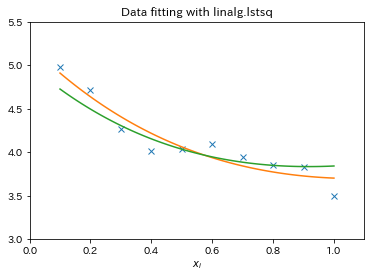

In [19]:
# 計画行列と観測値を与えてモデルパラメータを推定
c, resid, rank, sigma = linalg.lstsq(A, zi)

# パラメータ、残差の総和、Aのrank, Aの特異値
print(c, resid, rank, sigma)

xi2 = np.r_[0.1:1.0:100j]
yi2 = c[0]*np.exp(-xi2) + c[1]*xi2
yi_true = c1*np.exp(-xi2) + c2*xi2

plt.plot(xi,zi,'x',xi2,yi2, xi2, yi_true)
plt.axis([0,1.1,3.0,5.5])
plt.xlabel('$x_i$')
plt.title('Data fitting with linalg.lstsq')
plt.show()

### 固有値分解 ###

* `linalg.eig`
    * 固有値と固有ベクトルを求める
* `linalg.eigvals`
    * 固有値のみを求める
* エルミート行列または実対象行列の場合は`eigh`, `eigvalsh`が存在
* 疎行列の場合は`scipy.sparse.linalg`の`eigs`, `eighs`

In [20]:
A = np.array([[1, 2], [3, 4]])
(l1, l2), v = la.eig(A)

print(l1, l2)   # 固有値
print(v)        # 各列ベクトルが固有ベクトル
print(la.norm(v, axis=0))  # 固有ベクトルは正規化されている

# Ax = λxとなることを確認
# |1 2|  =  |v1 v2 ||l1  0| = |l1*v1 l2*v2|
# |3 4|            | 0 l2| 
print(A@v - v@np.diag((l1,l2)))

(-0.3722813232690143+0j) (5.372281323269014+0j)
[[-0.82456484 -0.41597356]
 [ 0.56576746 -0.90937671]]
[1. 1.]
[[ 0.00000000e+00+0.j -4.44089210e-16+0.j]
 [ 5.55111512e-17+0.j  0.00000000e+00+0.j]]


### 特異値分解 ###

* 擬似逆行列を求めるときや次元削減に使われる

$$ M = U\Sigma V^* $$

* Mはrank rのm行n列
    * Uはm行m列のユニタリ行列
    * $\Sigma$は対角方向に特異値が並んだm行n列行列
    * $V^*$はn行n列ユニタリ行列Vの随伴行列
* (m, n) = (m, m) @ (m, n) @ (n, n)

In [21]:
# 正方行列に対する特異値分解
A = np.arange(9).reshape((3, 3)) + np.diag([1, 0, 1])
U, s, Vh = la.svd(A)
Sig = np.diag(s)
print(A)
print(U.shape, s.shape, Sig.shape, Vh.shape)
print(U @ Sig @ Vh)

# 非正方行列に対する特異値分解
A = np.array([[1,2,3],[4,5,6]])
M,N = A.shape

U,s,Vh = linalg.svd(A)
Sig = la.diagsvd(s, M, N)
print("")
print(A)
print(U.shape, s.shape, Sig.shape, Vh.shape)
print(U@Sig@Vh)

[[1 1 2]
 [3 4 5]
 [6 7 9]]
(3, 3) (3,) (3, 3) (3, 3)
[[1. 1. 2.]
 [3. 4. 5.]
 [6. 7. 9.]]

[[1 2 3]
 [4 5 6]]
(2, 2) (2,) (2, 3) (3, 3)
[[1. 2. 3.]
 [4. 5. 6.]]


## scipy.fftpack ##

* 高速フーリエ変換、離散コサイン変換などができる
* `scipy.fftpack.fft`でFFTを実行
* `scipy.fftpack.fftfreq`で周波数軸の値を取得

In [22]:
import IPython.display

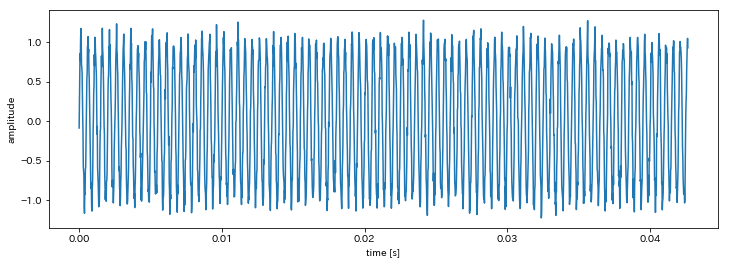

In [23]:
fs = 48000.0; nfft = 2048
xs = np.arange(1.0 * fs)  # 1[s]
ts = xs / fs
hz = 2000.0
ys = np.sin(2.0 * np.pi * hz * ts) + 0.1 * np.random.randn(int(fs))

fig = plt.figure(1, figsize=(12,4))
ax = fig.add_subplot(1, 1, 1)
ax.plot(ts[:nfft], ys[:nfft])
ax.set_xlabel("time [s]"); ax.set_ylabel("amplitude")

IPython.display.Audio(data=ys, rate=fs)

In [24]:
# 窓関数を取得
win = sg.get_window("hanning", nfft)

# FFTを実行
Ys = fft.fft(win * ys[:nfft], nfft)[:nfft//2+1]

# 周波数軸を取得
f = fft.fftfreq(nfft, d=1.0/fs)[:nfft//2+1]
f[-1] = fs//2  # デフォルトだと-24kHz

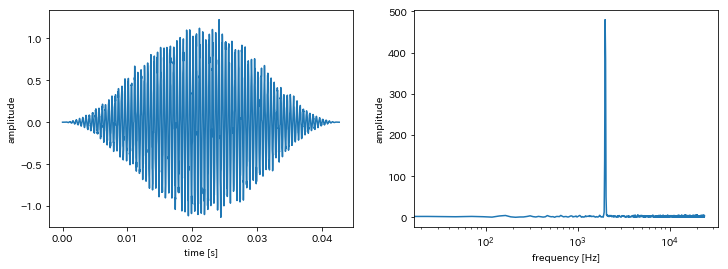

In [25]:
fig = plt.figure(1, figsize=(12,4));
ax = fig.add_subplot(1, 2, 1)
ax.plot(ts[:nfft], win * ys[:nfft])
ax.set_xlabel("time [s]"); ax.set_ylabel("amplitude")
ax = fig.add_subplot(1, 2, 2)
ax.semilogx(f, np.abs(Ys))
ax.set_xlabel("frequency [Hz]"); ax.set_ylabel("amplitude");

## scipy.interpolate ##

* 曲線の補間が可能
* `scipy.interpolate.interp1d`で補間関数を生成
* 生成した補間関数に補間点を与えると補間値を算出

In [26]:
# 観測値
xs = np.linspace(0, 1, 10)
ys = np.sin(2.0 * np.pi * xs) + 0.01 * np.random.randn(len(xs))

# 異なる2種類の補間関数の生成
linear_interp = interp.interp1d(xs, ys)
cubic_interp = interp.interp1d(xs, ys, kind='cubic')

# 補間値を算出
xs_new = np.linspace(0, 1, 50)
ys_lin = linear_interp(xs_new)
ys_cubic = cubic_interp(xs_new)

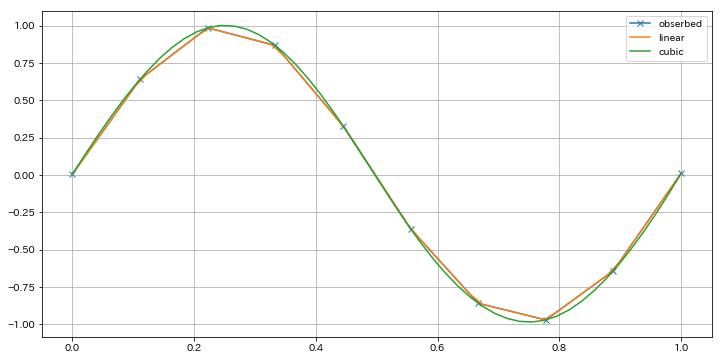

In [27]:
fig = plt.figure(figsize=(12,6)); ax = fig.add_subplot(111)
ax.plot(xs, ys, "x-", label="obserbed")
ax.plot(xs_new, ys_lin, label="linear")
ax.plot(xs_new, ys_cubic, label="cubic")
ax.grid(); ax.legend()

## scipy.signal ##

* 信号処理のためのライブラリ
    * フィルタ設計・フィルタリング
    * 畳み込み・時間相関計算
    * 窓関数

### ホワイトノイズに対するローパスフィルタの適用 ###

* `numpy.random.randn`でホワイトノイズを生成
* `scipy.signal.firwin`でローパスフィルタを設計
* `scipy.signal.lfilter`でローパスフィルタをホワイトノイズに対して適用

In [28]:
# ホワイトノイズの生成
time_s = 5.0
ys = 0.1 * np.random.randn(int(time_s * fs))
IPython.display.Audio(ys, rate=fs)

In [29]:
nlpf = 96
cutoff_hz = 4000.0
lpf = sg.firwin(nlpf, cutoff=cutoff_hz, fs=fs)
ys_lpf = sg.lfilter(lpf, [1.0], ys)
IPython.display.Audio(ys_lpf, rate=fs)

Text(0,0.5,'power [dB]')

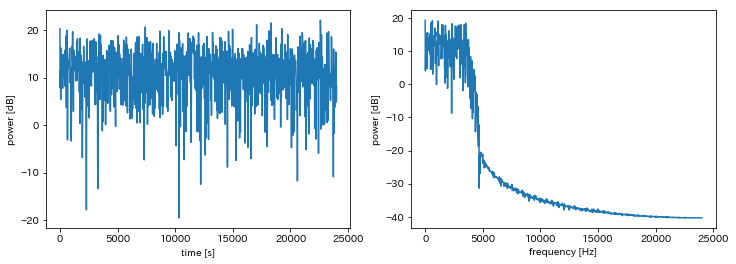

In [30]:
fig = plt.figure(1, figsize=(12,4));
ax = fig.add_subplot(1, 2, 1)
ax.plot(f, 20.0*np.log10(np.abs(fft.fft(ys, nfft)[:nfft//2+1])))
ax.set_xlabel("time [s]"); ax.set_ylabel("power [dB]")

ax = fig.add_subplot(1, 2, 2)
ax.plot(f, 20.0*np.log10(np.abs(fft.fft(ys_lpf, nfft))[:nfft//2+1]))
ax.set_xlabel("frequency [Hz]"); ax.set_ylabel("power [dB]")

### 参考 ###

音響信号処理についてはQiitaに過去に諸々記事を書いてます

* [Pythonで音響信号処理](https://qiita.com/wrist/items/5759f894303e4364ebfd)
* [Pythonで音響信号処理(2)](https://qiita.com/wrist/items/4b404230e264c5cb571c) 

## scipy.optimize ##

* 各種最適化アルゴリズムが実装
* `scipy.optimize.curve_fit`で曲線フィッティング
* `scipy.optimize.minimize`で最小値を見つける
* `scipy.optimize.root`で方程式の根を見つける

In [31]:
# ノイズの乗った正弦波を観測値とする
x_data = np.linspace(-5, 5, num=50)
y_data = 2.9 * np.sin(1.5 * x_data) + np.random.normal(size=50)

def test_func(x, a, b):
    return a * np.sin(b * x)

# curve_fitを用いてa, bを推定
params, params_covariance = opt.curve_fit(test_func, x_data, y_data, p0=[2, 2])
print(params, params_covariance)

[3.05684189 1.48600684] [[ 0.055698   -0.0005898 ]
 [-0.0005898   0.00061353]]


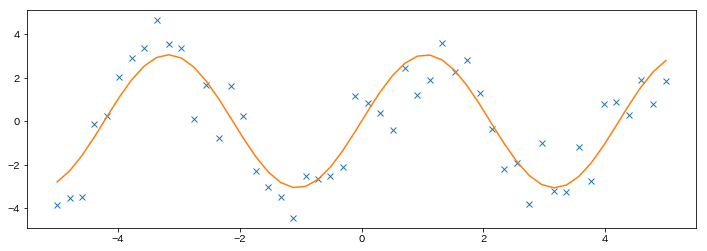

In [32]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(111)
ax.plot(x_data, y_data, "x")
ax.plot(x_data, test_func(x_data, params[0], params[1]))

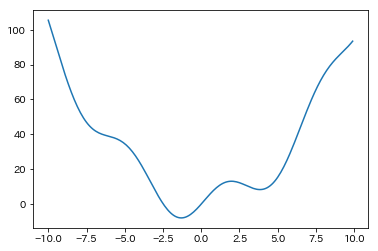

In [33]:
# 最小値を見つけたい対象
def f(x):
    return x**2 + 10*np.sin(x)

# 大域解が-1.3, 局所解が3.8
x = np.arange(-10.0, 10.0, 0.1)
fig = plt.figure(); ax = fig.add_subplot(111)
ax.plot(x, f(x))

In [34]:
result = opt.minimize(f, x0=0.0)  # x0で探索開始点を与える
print(result)
print(result.x)

      fun: -7.945823375615215
 hess_inv: array([[0.08589237]])
      jac: array([-1.1920929e-06])
  message: 'Optimization terminated successfully.'
     nfev: 18
      nit: 5
     njev: 6
   status: 0
  success: True
        x: array([-1.30644012])
[-1.30644012]


In [35]:
# nfev(評価回数)が12に減る
opt.minimize(f, x0=0, method="L-BFGS-B")

      fun: array([-7.94582338])
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([-1.50990331e-06])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 12
      nit: 5
   status: 0
  success: True
        x: array([-1.30644014])

In [36]:
# 3.0から始めると局所解に陥る
result = opt.minimize(f, x0=3.0, method="L-BFGS-B")
print(result)
print(result.x)

      fun: array([8.31558558])
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([-1.77635684e-07])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 14
      nit: 6
   status: 0
  success: True
        x: array([3.83746709])
[3.83746709]


In [37]:
# `scipy.optimize.basinhopping`を用いて大域解を探す
opt.basinhopping(f, 1.0)

                        fun: -7.945823375615284
 lowest_optimization_result:       fun: -7.945823375615284
 hess_inv: array([[0.08581295]])
      jac: array([1.1920929e-07])
  message: 'Optimization terminated successfully.'
     nfev: 15
      nit: 3
     njev: 5
   status: 0
  success: True
        x: array([-1.30644001])
                    message: ['requested number of basinhopping iterations completed successfully']
      minimization_failures: 0
                       nfev: 1515
                        nit: 100
                       njev: 505
                          x: array([-1.30644001])

In [38]:
# 探索範囲に制約を与えることも可能
res = opt.minimize(f, x0=1,
                   bounds=((0, 10), ))
res.x    

array([0.])

In [39]:
# f=0となる点をoptimize.rootで探す
root = opt.root(f, x0=1)
print(root)
print(root.x)

    fjac: array([[-1.]])
     fun: array([0.])
 message: 'The solution converged.'
    nfev: 10
     qtf: array([1.33310463e-32])
       r: array([-10.])
  status: 1
 success: True
       x: array([0.])
[0.]


In [40]:
# もうひとつの根を探す
root = opt.root(f, x0=-3.0)
print(root)
print(root.x)

    fjac: array([[-1.]])
     fun: array([-1.77635684e-15])
 message: 'The solution converged.'
    nfev: 8
     qtf: array([-2.83790769e-11])
       r: array([12.84592704])
  status: 1
 success: True
       x: array([-2.47948183])
[-2.47948183]


## scipy.stat ##

* 統計や確率分布、統計的検定のためのモジュール
* サンプル点の正規分布へのフィッティング等を紹介

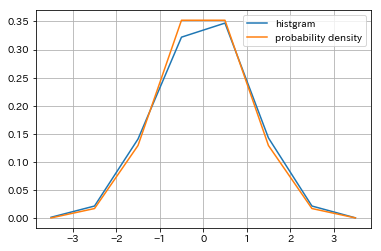

In [41]:
# サンプリングした点のヒストグラム(頻度分布)と確率分布を同時に描画
samples = np.random.normal(size=1000) # sampling

bins = np.arange(-4, 5)
histogram = np.histogram(samples, bins=bins, normed=True)[0] # plot histogram

bins = 0.5*(bins[1:] + bins[:-1])
pdf = stats.norm.pdf(bins)  # normは正規分布の意味

fig = plt.figure(); ax = fig.add_subplot(111)
ax.plot(bins, histogram, label="histgram")
ax.plot(bins, pdf, label="probability density")
ax.grid(); ax.legend()

0.014729738495055104 0.9911940562256367


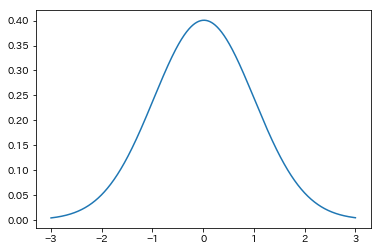

In [42]:
# 観測値を確率分布にフィッティング
loc, std = stats.norm.fit(samples)
print(loc, std)
xs = np.linspace(-3.0, 3.0, 1000)
f = lambda x: (1.0/np.sqrt(2.0*np.pi*std))*np.exp(-(x - loc)**2/ (2.0 * std**2))
plt.plot(xs, f(xs))

In [43]:
# 平均、中央値、四分位数
print(np.mean(samples))
print(np.median(samples))
print(stats.scoreatpercentile(samples, 50))
print(stats.scoreatpercentile(samples, 90))

0.014729738495055104
0.03258817640410924
0.03258817640410924
1.300282756931229


## scipy.spatial ##

* 空間データや距離を扱うためのモジュール
* 距離行列を計算する`scipy.spatial.distance`の`cdist`, `pdist`のみ紹介

In [44]:
from scipy.spatial import distance
coords = [(35.0456, -85.2672),
          (35.1174, -89.9711),
          (35.9728, -83.9422),
          (36.1667, -86.7833)]

print(np.sqrt((coords[0][0] - coords[1][0])**2
             +(coords[0][1] - coords[1][1])**2))
distance.cdist(coords, coords, 'euclidean')

4.704447943170383


array([[0.        , 4.70444794, 1.6171966 , 1.88558331],
       [4.70444794, 0.        , 6.0892811 , 3.35605413],
       [1.6171966 , 6.0892811 , 0.        , 2.84770898],
       [1.88558331, 3.35605413, 2.84770898, 0.        ]])

In [45]:
# pdistは対角を除いた上三角成分のみ返す
presult = distance.pdist(coords)
print(presult)

# squareformで距離行列に変換
print(distance.squareform(presult))

[4.70444794 1.6171966  1.88558331 6.0892811  3.35605413 2.84770898]
[[0.         4.70444794 1.6171966  1.88558331]
 [4.70444794 0.         6.0892811  3.35605413]
 [1.6171966  6.0892811  0.         2.84770898]
 [1.88558331 3.35605413 2.84770898 0.        ]]


## scipy.misc ##

* deprecatedな関数を除くと4つのみ
    * face
    * central_diff_weight
    * derivative
    * ascent

(768, 1024, 3)
255
uint8


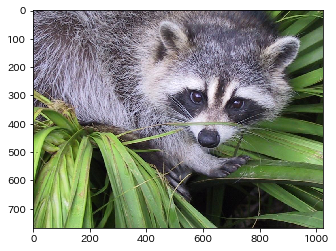

In [46]:
import scipy.misc
import matplotlib.cm as cm
face = scipy.misc.face()

print(face.shape)
print(face.max())
print(face.dtype)

fig = plt.figure(1)
ax = fig.add_subplot(1, 1, 1)
ax.imshow(face)

plt.show()

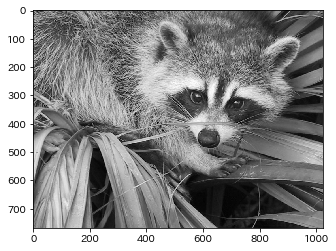

In [47]:
face = scipy.misc.face(gray=True)

fig = plt.figure(1)
ax = fig.add_subplot(1, 1, 1)
ax.imshow(face, cmap=cm.gray)

plt.show()

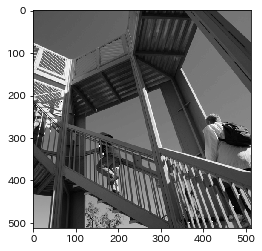

In [48]:
# グレースケールのデモ用画像
ascent = scipy.misc.ascent()
fig = plt.figure(1)
ax = fig.add_subplot(111)
ax.imshow(ascent, cmap=cm.gray)
plt.show()

In [49]:
from scipy.misc import derivative

# x0の点におけるn次の中心差分を返す
# n==1の場合はf(x+h)-f(x-h)/2h
# 内部的にcentral_diff_weightを使う

# derivative(func, x0, dx=1.0, n=1, args=(), order=3)
f = lambda x: x**3 + x**2
derivative(f, 1.0, dx=1e-6)

4.999999999921734

In [50]:
print((f(1.0 + 1e-6) - f(1.0 - 1e-6)) / (2.0 * 1.e-6))

4.999999999921734


## デモ ##

* scipy.fftpackとscipy.signalを使ったNMFによるモノラル音源分離のデモ
    * NMFはscikit-learnの実装を使用
* 音楽情報処理ライブラリlibrosaのデモ音源を使用
* `librosa.decompose.decompose`と同等の処理

### NMF ###

* 非負値行列$\textbf{X}$を$\textbf{X} \simeq \textbf{WH} $と分解する手法
    * Hを基底行列、Wをアクティベーションと呼ぶ
* scikit-learnのNMFでは下記目的関数を最小化

$$0.5 * ||\textbf{X} - \textbf{WH}||_{Fro}^2
+ \alpha l1_{ratio} ||vec(W)||_1
+ \alpha l1_{ratio} ||vec(H)||_1
+ 0.5 \alpha (1 - l1_{ratio}) ||W||_{Fro}^2
+ 0.5 \alpha (1 - l1_{ratio}) ||H||_{Fro}^2
$$

* 通常最適化には補助関数法が使われる

### 音響信号における非負行列 ###

* 音を短時間波形に切り出した各断片をFFT
* 断片から求めた振幅スペクトルを時間方向に並べたスペクトログラムを行列とみなす

In [51]:
!pip install librosa

In [52]:
import librosa
import librosa.display

In [53]:
y, sr = librosa.load(librosa.util.example_audio_file())
IPython.display.Audio(data=y, rate=sr)

In [54]:
np.pad(np.arange(5), 2, "reflect")

array([2, 1, 0, 1, 2, 3, 4, 3, 2])

In [55]:
# strideトリックを使った信号を短時間波形フレームの配列に変換する関数
from numpy.lib.stride_tricks import as_strided

def split_frames(xs, frame_width=1024, noverlap=2):

    nsample = np.alen(xs)
    nshift = (frame_width // noverlap)
    nframe = int(nsample / nshift) - noverlap + 1
    
    nbyte = xs.dtype.itemsize

    # as_strided(xs, ys_shape, new_stride)
    xs_split = as_strided(xs, (nframe, frame_width), (nbyte * nshift, nbyte))
    
    return xs_split

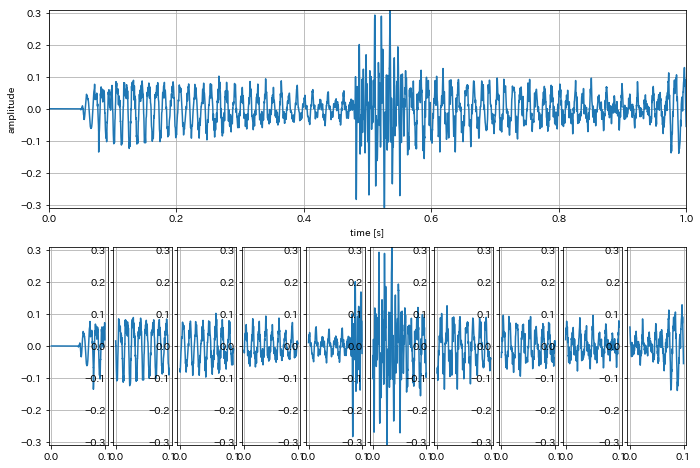

In [56]:
# 信号の短時間波形への切り出し
import matplotlib.gridspec as gridspec

fig = plt.figure(1, figsize=(12,8))
gs = gridspec.GridSpec(2, 21)

ax = fig.add_subplot(gs[0, :-1])
xs = np.arange(len(y)) / sr
ax.plot(xs[:sr], y[:sr])
ymax = np.max(y[:sr])
ax.set_xlim([0.0, 1.0]); ax.set_ylim([-ymax, ymax]);
ax.set_xlabel("time [s]"); ax.set_ylabel("amplitude"); ax.grid()

frame_width = sr * 0.1
xs = np.arange(frame_width) / sr
for i, y_cut in enumerate(split_frames(y, int(frame_width), 1)[:10]):
    ax = fig.add_subplot(gs[1, 2*i:2*(i+1)])
    ax.plot(xs, y_cut)
    ax.set_ylim([-ymax, ymax]); ax.grid()

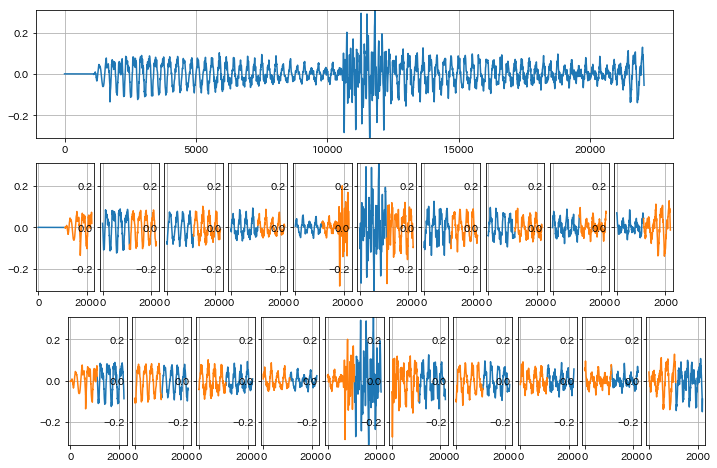

In [57]:
# 切り出し間隔を1/2オーバーラップした場合
import matplotlib.gridspec as gridspec

fig = plt.figure(1, figsize=(12,8))
gs = gridspec.GridSpec(3, 21)

ax = fig.add_subplot(gs[0, :-1])
ax.plot(y[:sr])
ymax = np.max(y[:sr])
ax.set_ylim([-ymax, ymax]); ax.grid()

frame_width = sr * 0.1
half_width = int(frame_width // 2)
xs = np.arange(frame_width)
for i, y_cut in enumerate(split_frames(y, int(frame_width), 2)[:20]):
    if i % 2 == 0:
        ax = fig.add_subplot(gs[1, i:i+2])
        ax.plot(xs[:half_width], y_cut[:half_width])
        ax.plot(xs[half_width:], y_cut[half_width:])
    else:
        ax = fig.add_subplot(gs[2, i:i+2])
        ax.plot(xs[half_width:], y_cut[half_width:])
        ax.plot(xs[:half_width], y_cut[:half_width])

    ax.set_ylim([-ymax, ymax]); ax.grid()

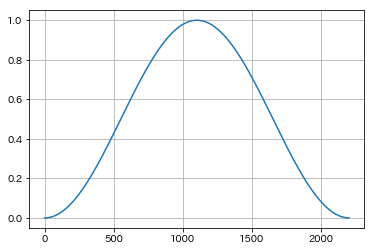

In [58]:
frame_width = int(sr * 0.1)
win = sg.get_window("hanning", frame_width)
fig = plt.figure(1)
ax = fig.add_subplot(111)
ax.plot(win)
ax.grid()

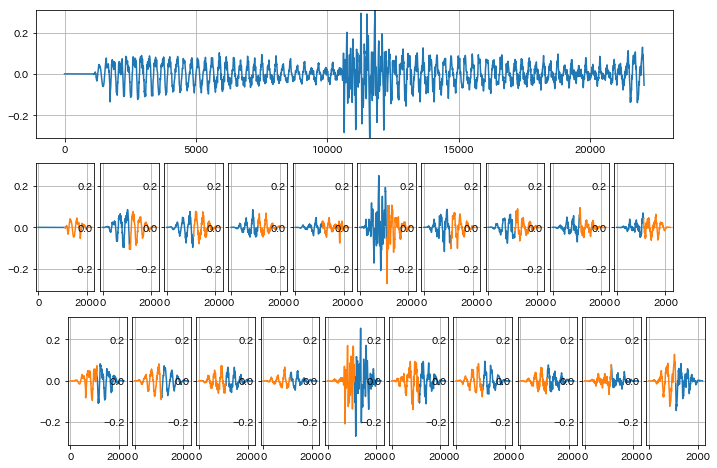

In [59]:
# 更に各短時間波形に窓掛けを行った場合
import matplotlib.gridspec as gridspec

fig = plt.figure(1, figsize=(12,8))
gs = gridspec.GridSpec(3, 21)

ax = fig.add_subplot(gs[0, :-1])
ax.plot(y[:sr])
ymax = np.max(y[:sr])
ax.set_ylim([-ymax, ymax]); ax.grid()

frame_width = sr * 0.1
half_width = int(frame_width // 2)
win = sg.get_window("hanning", int(frame_width))
xs = np.arange(frame_width)
for i, y_cut in enumerate(split_frames(y, int(frame_width), 2)[:20]):
    y_win = win * y_cut
    if i % 2 == 0:
        ax = fig.add_subplot(gs[1, i:i+2])
        ax.plot(xs[:half_width], y_win[:half_width])
        ax.plot(xs[half_width:], y_win[half_width:])
    else:
        ax = fig.add_subplot(gs[2, i:i+2])
        ax.plot(xs[half_width:], y_win[half_width:])
        ax.plot(xs[:half_width], y_win[:half_width])

    ax.set_ylim([-ymax, ymax]); ax.grid()

In [60]:
# 1/4オーバーラップして窓掛けした各波形をそれぞれFFT
nfft = 2048
win = sg.get_window("hanning", nfft)
y_center = np.pad(y, int(nfft//2), "reflect")
fft_list = []
phase_list = []
for y_cut in split_frames(y_center, nfft, 4):
    y_end = min(len(y_cut), nfft)
    y_win = np.zeros(nfft)
    y_win[:y_end] = win[:y_end] * y_cut[:y_end]
    Y = fft.fft(y_win, nfft)
    fft_list.append(Y[:nfft//2+1])
    phase_list.append(np.exp(1.j * np.angle(Y[:nfft//2+1])))

my_D = np.array(fft_list, dtype=np.complex64).T
my_phase = np.array(phase_list, dtype=np.complex64).T

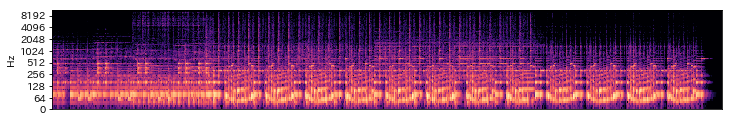

In [61]:
fig = plt.figure(1, figsize=(12,4))
ax = fig.add_subplot(2,1,1)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(my_D), ref=np.max), y_axis="log")

In [62]:
# 得られたスペクトログラムnp.abs(my_D.T)に対してNMFを実行
from sklearn.decomposition import NMF
model = NMF(n_components=8)
W = model.fit_transform(np.abs(my_D.T))
H = model.components_

components = H.T
activations = W.T

Text(0.5,1,'Components')

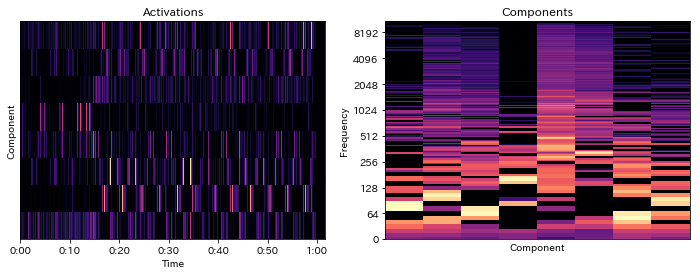

In [63]:
fig = plt.figure(2, figsize=(12,4))

ax = fig.add_subplot(1,2,1)
librosa.display.specshow(activations, x_axis='time')
ax.set_xlabel('Time'); ax.set_ylabel('Component'); ax.set_title('Activations')

ax = fig.add_subplot(1,2,2)
librosa.display.specshow(librosa.amplitude_to_db(components, ref=np.max), y_axis='log')
ax.set_xlabel('Component'); ax.set_ylabel('Frequency'); ax.set_title('Components')

In [64]:
# 1.e-12以下となっている要素の数をコンポーネントごとに算出
for i in range(8):
    print(sum(np.where(components[:, i] < 1.e-12, 1, 0)))

479
24
30
918
8
28
266
217


In [65]:
# Play back the reconstruction
# Reconstruct a spectrogram by the outer product of component k and its activation
D_k = components @ activations

# invert the stft after putting the phase back in
#y_k = librosa.istft(D_k * phase)
y_k = librosa.istft(D_k * my_phase)

# And playback
print('Full reconstruction')

IPython.display.Audio(data=y_k, rate=sr)

Full reconstruction


In [66]:
components_ = np.zeros(components.shape)
components_[:, 0] = components[:, 0]
components_[:, 2] = components[:, 2]
components_[:, 6] = components[:, 6]

D_k = components_ @ activations

# invert the stft after putting the phase back in
y_k = librosa.istft(D_k * my_phase)

# And playback
print('Partly reconstruction')

IPython.display.Audio(data=y_k, rate=sr)

Partly reconstruction


## まとめ ##

* SciPyの各モジュールとコード片を紹介
* fftpackとsignalで音の信号処理ができる

### 個人的によく使う関数 ###

* scipy.ndimage.interpolation.shift
    * 配列を単純にシフトし、要素が無くなったところに指定した値を埋める
    * numpyのrollだと要素が回転しまう

In [67]:
from scipy.ndimage.interpolation import shift
xs = np.array([ 0., 1., 2., 3., 4., 5., 6., 7., 8., 9.]) 
print(shift(xs, -3, cval=0.0))
print(np.roll(xs, -3))

[3. 4. 5. 6. 7. 8. 9. 0. 0. 0.]
[3. 4. 5. 6. 7. 8. 9. 0. 1. 2.]
